<a href="https://colab.research.google.com/github/nupursjsu/Deep-Learning/blob/master/assignment_3/Graded_HW3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-label prediction with Planet Amazon dataset using Keras and with Tensorboard integration

Following is the Kaggle link to Planet Amazon dataset

[Planet Amazon dataset link](https://www.kaggle.com/c/planet-understanding-the-amazon-from-space/data)

## Importing necessary libraries

In [31]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pandas as pd
import zipfile
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the TensorBoard notebook extension
%load_ext tensorboard
import datetime
# Clear any logs from previous runs
!rm -rf ./logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
np.random.seed(1)

##Loading datasets

In [0]:
#Code to read files into Colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

#Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
#Downloading the train images folder from drive
link = 'https://drive.google.com/open?id=1o-PCjSNWGJ5VIdgkZEyWcC24kaK47BiY'
fluff, id = link.split('=')

downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('train-jpg.zip')

#Unziping the folder
with zipfile.ZipFile('train-jpg.zip', 'r') as zip_ref:
    zip_ref.extractall()

In [0]:
#Downloading the test images folder from drive
link = 'https://drive.google.com/open?id=1UQRPhQeTiTKhRKEyXUXTBtNsNb6GQU1d'
fluff, id = link.split('=')

downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('test-jpg.zip')

#Unziping the folder
with zipfile.ZipFile('test-jpg.zip', 'r') as zip_ref:
    zip_ref.extractall()

In [0]:
#Downloading the train csv file which contains image names and labels
link = 'https://drive.google.com/open?id=1qO-8eRFEiXK9RG6G6Xd5gVHa70zN_Ami'
fluff, id = link.split('=')

downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('train-v2.csv')

In [0]:
#Downloading the test csv file which contains image names and labels
link = 'https://drive.google.com/open?id=1rcm_3sOELQSmxUy0YbmArqnv-hcdOHKA'
fluff, id = link.split('=')

downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('test-v2.csv')

In [0]:
#Loading train and test dataset into pandas dataframe
train_data = pd.read_csv('train-v2.csv')
test_data = pd.read_csv('test-v2.csv')

## Data exploration and preprocessing

In [39]:
#Displaying first few records in train data
train_data.head()

,image_name,tags
0,train_0,haze primary
1,train_1,agriculture clear primary water
2,train_2,clear primary
3,train_3,clear primary
4,train_4,agriculture clear habitation primary road


Each image is associated with multiple lables.

In [40]:
#Displaying all unique labels
from itertools import chain
labels_list = list(chain.from_iterable([tags.split(" ") for tags in train_data['tags'].values]))
labels_set = set(labels_list)
label_map = {l: i for i, l in enumerate(labels_set)}
print(label_map)

{'clear': 0, 'haze': 1, 'bare_ground': 2, 'artisinal_mine': 3, 'water': 4, 'cultivation': 5, 'road': 6, 'slash_burn': 7, 'blooming': 8, 'selective_logging': 9, 'conventional_mine': 10, 'agriculture': 11, 'blow_down': 12, 'partly_cloudy': 13, 'habitation': 14, 'cloudy': 15, 'primary': 16}


There are total 17 unique labels in the dataset. Displaying 17 pictures below to see what are the differences between the different labels.

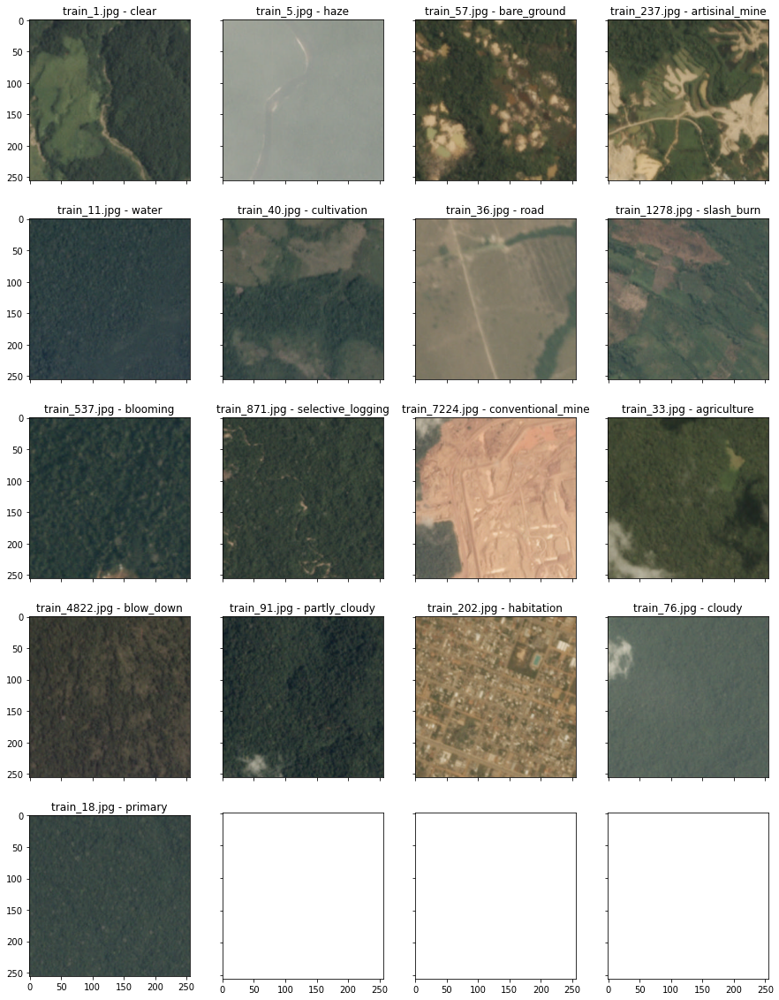

In [41]:
#Displaying 17 images with their labels to see what kind of images we are dealing with
images_title = [train_data[train_data['tags'].str.contains(label)].iloc[i]['image_name'] + '.jpg' 
                for i, label in enumerate(labels_set)]

plt.rc('axes', grid=False)
_, axs = plt.subplots(5, 4, sharex='col', sharey='row', figsize=(15, 20))
axs = axs.ravel()

for i, (image_name, label) in enumerate(zip(images_title, labels_set)):
    img = mpimg.imread('train-jpg/' + '/' + image_name)
    axs[i].imshow(img)
    axs[i].set_title('{} - {}'.format(image_name, label))

In [42]:
#Getting train images and their corresponding labels as numpy arrays 
train_images = []
train_labels = []

for i, labels in tqdm(train_data.values, miniters=6000):
    image = cv2.imread('train-jpg/{}.jpg'.format(i))
    targets = np.zeros(17)
    for j in labels.split(' '):
        targets[label_map[j]] = 1 
    train_images.append(cv2.resize(image, (32, 32)))
    train_labels.append(targets)
    
train_labels = np.array(train_labels, np.uint8)
train_images = np.array(train_images, np.float16) / 255.   #Normalizing train images

100%|██████████| 40479/40479 [00:47<00:00, 859.49it/s]


In [43]:
#Getting test images and their corresponding labels as numpy arrays 
test_images= []
test_labels = []

for i, labels in tqdm(test_data.values, miniters=6000):
    try:
      image = cv2.imread('test-jpg/{}.jpg'.format(i))
      targets = np.zeros(17)
      for j in labels.split(' '):
        targets[label_map[j]] = 1 
      test_images.append(cv2.resize(image, (32, 32)))
      test_labels.append(targets)
    except:
      continue
    
test_labels = np.array(test_labels, np.uint8)
test_images = np.array(test_images, np.float16) / 255.  #Normalizing test images

100%|██████████| 61191/61191 [00:48<00:00, 1266.25it/s]


In [44]:
#Splitting train dataset into train and validation datasets
trainvalSplit = 32000
train_images, val_images, train_labels, val_labels = train_images[:trainvalSplit], train_images[trainvalSplit:], train_labels[:trainvalSplit], train_labels[trainvalSplit:]
print(train_images.shape, val_images.shape, train_labels.shape, val_labels.shape)

(32000, 32, 32, 3) (8479, 32, 32, 3) (32000, 17) (8479, 17)


## Building and compiling Keras CNN model

In [0]:
#Importing necessary libraries to build CNN model
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers. normalization import BatchNormalization

Taking number of units as '128' at dense layer, optimizer as 'adam' and dropout rate as '0.2'

In [0]:
#Creating CNN
model = Sequential()
model.add(Conv2D(64, kernel_size=(3,3), activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Conv2D(32, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Flatten())
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(17, activation = 'sigmoid'))

In [0]:
#Compiling the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics = ['accuracy'])

In [48]:
#Displaying model summary
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 30, 30, 64)        1792      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 15, 15, 64)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 15, 15, 64)        256       
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 13, 13, 32)        18464     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 6, 6, 32)          0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 1152)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 128)              

## Using tensorboard with Keras model.fit()

In [49]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
#Fitting the model
model.fit(train_images, train_labels, batch_size = 10, epochs = 3, verbose = 1, validation_data=(val_images, val_labels), callbacks=[tensorboard_callback])

Train on 32000 samples, validate on 8479 samples
Epoch 1/3
32000/32000 [==============================] - 23s 726us/step - loss: 0.1953 - accuracy: 0.9237 - val_loss: 0.1701 - val_accuracy: 0.9338
Epoch 2/3
32000/32000 [==============================] - 22s 698us/step - loss: 0.1663 - accuracy: 0.9337 - val_loss: 0.1822 - val_accuracy: 0.9345
Epoch 3/3
32000/32000 [==============================] - 23s 711us/step - loss: 0.1585 - accuracy: 0.9365 - val_loss: 0.2025 - val_accuracy: 0.9196


## Evaluating the model on test data

In [50]:
#Evaluating the model
_,test_accuracy = model.evaluate(test_images, test_labels, verbose=0)
print('Test Accuracy: %.3f' % (test_accuracy*100))

Test Accuracy: 84.887


## Tensorboard visualization

In [51]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

## Tuning Hyperparameters

Taking number of units as '130' at dense layer, optimizer as 'sgd' and dropout rate as '0.3'

In [0]:
def tune_model(hparams):
  model = keras.models.Sequential()
  model.add(Conv2D(64, (3, 3), input_shape=(32, 32, 3),activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(BatchNormalization())
  model.add(Conv2D(32, (3, 3), activation='relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Flatten())
  model.add(Dense(hparams['num_units'], activation='relu'))
  model.add(Dropout(hparams['dropout_rate']))
  model.add(Dense(units=17, activation='sigmoid'))
  model.compile(optimizer= hparams['optimizer'],
                loss='binary_crossentropy',
                metrics=['accuracy'])
  
  log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1) 
  model.fit(train_images, train_labels,batch_size=10,epochs=3,verbose=1,validation_data=(val_images, val_labels),callbacks=[tensorboard_callback])
  _, test_accuracy = model.evaluate(test_images, test_labels)
  return test_accuracy

In [53]:
tune_model({'num_units' : 130, 'dropout_rate' : 0.3, 'optimizer' : 'sgd'})

Train on 32000 samples, validate on 8479 samples
Epoch 1/3
32000/32000 [==============================] - 19s 609us/step - loss: 0.2509 - accuracy: 0.9068 - val_loss: 0.2084 - val_accuracy: 0.9187
Epoch 2/3
32000/32000 [==============================] - 19s 599us/step - loss: 0.2146 - accuracy: 0.9170 - val_loss: 0.2020 - val_accuracy: 0.9196
Epoch 3/3
40669/40669 [==============================] - 4s 101us/step


0.8220781683921814

Taking number of units as '150' at dense layer, optimizer as 'adam' and dropout rate as '0.5'

In [54]:
tune_model({'num_units' : 150, 'dropout_rate' : 0.5, 'optimizer' : 'adam'})

Train on 32000 samples, validate on 8479 samples
Epoch 1/3
32000/32000 [==============================] - 24s 740us/step - loss: 0.2053 - accuracy: 0.9207 - val_loss: 0.1965 - val_accuracy: 0.9223
Epoch 2/3
32000/32000 [==============================] - 23s 711us/step - loss: 0.1729 - accuracy: 0.9319 - val_loss: 0.1762 - val_accuracy: 0.9317
Epoch 3/3
40669/40669 [==============================] - 4s 97us/step


0.8181745409965515

In [55]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 726), started 0:02:16 ago. (Use '!kill 726' to kill it.)

<IPython.core.display.Javascript object>

## Uploading results to Tensorboard dev

In [56]:
!tensorboard dev upload --logdir logs

2020-05-05 00:07:13.111434: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Data for the "graphs" plugin is now uploaded to TensorBoard.dev! Note that uploaded data is public. If you do not want to upload data for this plugin, use the "--plugins" command line argument.
Upload started and will continue reading any new data as it's added
to the logdir. To stop uploading, press Ctrl-C.
View your TensorBoard live at: https://tensorboard.dev/experiment/oEdjOho1RVOxUxyIgYa6uQ/

Upload stopped. View your TensorBoard at https://tensorboard.dev/experiment/oEdjOho1RVOxUxyIgYa6uQ/
^C


In [57]:
!tensorboard dev update-metadata --experiment_id 'Ds6axoMeT76MSVyiEeauEg' --name "Amazon planet CNN model" --description "Model tuning with hyperparameters"

2020-05-05 00:08:44.539468: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
Data for the "graphs" plugin is now uploaded to TensorBoard.dev! Note that uploaded data is public. If you do not want to upload data for this plugin, use the "--plugins" command line argument.
